<center> <h1>Universidad Nacional de San Agustín de Arequipa</h1> </center> 
<center> <h1>Escuela Profesional de Ingeniería de Telecomunicaciones</h1> </center> 

<center> <h1> </h1> </center> 

<center><img src="https://user-images.githubusercontent.com/19308295/115939517-f1c6fe80-a463-11eb-989c-812ab4942586.png" width="380" height="4200"></center>

<center> <h2>Ingeniero Renzo Bolivar - Docente DAIE</h2> </center> 

<center> <h1>Curso : Computación 2</h1> </center> 

<center> <h1>Grupo : A-3</h1> </center>

<center> <h1>Integrantes:</h1> </center>

<center> <h2>Boza Anampa, Diego Alexander</h2> </center>

<center> <h2>Cáceres Ramos, Molly Tamara</h2> </center>

<center> <h2>Camargo Calatayud, Alejandro Victor Terry </h2> </center>

<center> <h2>Ccoa Arque, Ronaldo</h2> </center>

<center> <h2>Huamani Quispe, Elisban</h2> </center>

<center> <h2>Mamani Alvarez, Rudy</h2> </center>

<center> <h1>2023</h1> </center>

![linea 1](https://user-images.githubusercontent.com/19308295/115926252-2b8a0c00-a448-11eb-9d9c-b43beaf0ff68.png)

<center> <h1>ÁRBOL DE DECISIONES</h1> </center> 


![linea 1](https://user-images.githubusercontent.com/19308295/115926252-2b8a0c00-a448-11eb-9d9c-b43beaf0ff68.png)

## Predicción de abandono de clientes bancarios

### Importamos librerias

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from funpymodeling.exploratory import status , profiling_num , freq_tbl, cat_vars, num_vars
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### Abrimos la data

##### Importación de datos
https://www.kaggle.com/code/kmalit/bank-customer-churn-prediction/data


#### Información sobre las columnas:

* **RowNumber :** Indica el número de fila.
* **CustomerId :** Muestra el ID del cliente.
* **Surname :** Apellido del cliente. 
* **CreditScore :** Indica el puntaje crediticio del cliente.
* **Geography :** Indica al pais al que pertenece el cliente.
* **Gender :** Indica el género mujer u hombre.
* **Age	 :** Indica la edad del cliente.
* **Tenure :** Indica la tenencia en años de la cuenta bancaria.
* **Balance :** Indica el patrimonio del cliente en el banco.
* **NumOfProducts :** Indica el número de productos del cliente en el banco.
* **HasCrCard :** Indica si el cliente cuenta con tarjeta de credito.
* **IsActiveMember :** Indica si el cliente es miembro activo en el banco.
* **EstimatedSalary	 :** Indica el salario anual del cliente en el banco.
* **Exited :** Indica si el cliente abandono el banco o no.

## 1.- Estado de salud

In [2]:
df= pd.read_csv('Data/Churn_Modelling.csv')

<div class="alert alert-info">

- Usamos la libreria **Pandas** para leer el archivo CSV, de esta manera podemos cargar los datos y asi poder visualizarlo en un DataFrame.
    
</div>

#### Visualizamos las 5 primeras filas del dataframe

In [3]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


<div class="alert alert-info">

- Usamos **df.head( )** para visualizar las primeras filas del DataFrame, se mostrará por defecto las primeras 5 filas del DataFrame.
    
</div>

#### Visualizamos las 5 últimas filas del dataframe

In [4]:
df.tail()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.79,1,1,0,38190.78,0


<div class="alert alert-info">

- Usamos **df.tail( )** para visualizar las últimas 5 filas del DataFrame.
    
</div>

#### Visualizamos el número filas y columnas del DataFrame 

In [5]:
df.shape

(10000, 14)

<div class="alert alert-info">

- Se hace uso del atributo **shape** para obtener una vista rápida del tamaño del DataFrame para poder realizar el análisis de datos. 
    
    <strong>10000:</strong> Representa el número de filas en el DataFrame.<br>
    <strong>14:</strong> Representa el número de columnas en el DataFrame.<br><br>
    
    
- Cada fila en el DataFrame corresponde a un registro o una observación en los datos, mientras que cada columna representa una característica o una variable.
    
</div>

#### Visualizamos si hay valores nulos en el DataFrame

In [6]:
df.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

<div class="alert alert-info">

- Usamos el método **isnull( ).sum( )** para contar la cantidad de valores faltantes (valores nulos) en cada columna del DataFrame.
    
- Podemos visualizar que no hay valores NaN, lo que quiere decir que todas las celdas del DataFrame tienen un valor válido.
</div>

#### Visualizamos el nombre de las columnas del dataframe

In [7]:
df.columns

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

<div class="alert alert-info">

- Usamos el atributo **columns** para obtener una lista con los nombres de las columnas del DataFrame.
    
</div>

#### Renombramos los nombres de las columnas

In [8]:
df.rename(columns={'RowNumber': 'Numero_Fila',
                   'CustomerId': 'ID_Cliente',
                   'Surname': 'Apellido',
                   'CreditScore': 'Puntaje_crediticio',
                   'Geography': 'Pais', 
                   'Gender': 'Genero', 
                   'Age': 'Edad', 
                   'Tenure': 'Tenencia_en_años', 
                   'Balance': 'Saldo_en_cuenta', 
                   'NumOfProducts': 'Numero_productos', 
                   'HasCrCard': 'Tarjeta_credito', 
                   'IsActiveMember': 'Miembro_activo', 
                   'EstimatedSalary': 'Salario_estimado',
                   'Exited': 'Objetivo',}, inplace=True)
df

,Numero_Fila,ID_Cliente,Apellido,Puntaje_crediticio,Pais,Genero,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,Objetivo
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


<div class="alert alert-info">

- Se modificó los nombres de las columnas del DataFrame a Español para un mejor entendimiento debido a que el DataFrame original esta en Ingles. Se hace uso del método **rename( )**, que permite cambiar los nombres de las columnas especificados en un diccionario.
    
</div>

In [9]:
df.columns

Index(['Numero_Fila', 'ID_Cliente', 'Apellido', 'Puntaje_crediticio', 'Pais',
       'Genero', 'Edad', 'Tenencia_en_años', 'Saldo_en_cuenta',
       'Numero_productos', 'Tarjeta_credito', 'Miembro_activo',
       'Salario_estimado', 'Objetivo'],
      dtype='object')

<div class="alert alert-info">

- Visualizamos los nuevos nombres de las columnas en una lista haciendo uso de **df.columns( )**.
    
</div>

#### Se eliminan las columnas innecesarias

In [10]:
df=df.drop(['Numero_Fila','ID_Cliente','Apellido'], axis=1)
df

,Puntaje_crediticio,Pais,Genero,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,Objetivo
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


<div class="alert alert-info">

- Se hace uso del método **drop( )** para eliminar las columnas innecesarias del DataFrame. Se eliminarán las columnas **Numero_Fila**, **ID_Cliente** y **Apellido**, debido a que no aportará información reelevante en el análisis de datos.
    
</div>

#### Visualizamos con profiling_num( ) una estadística mejorada de los datos

In [11]:
profiling_num(df)

,variable,mean,std_dev,variation_coef,p_0.01,p_0.05,p_0.25,p_0.5,p_0.75,p_0.95,p_0.99
0,Puntaje_crediticio,650.528800,96.653299,0.148577,432.0000,489.0000,584.00,652.000,718.0000,812.0000,850.0000
1,Edad,38.921800,10.487806,0.269458,21.0000,25.0000,32.00,37.000,44.0000,60.0000,72.0000
2,Tenencia_en_años,5.012800,2.892174,0.576958,0.0000,1.0000,3.00,5.000,7.0000,9.0000,10.0000
3,Saldo_en_cuenta,76485.889288,62397.405202,0.815803,0.0000,0.0000,0.00,97198.540,127644.2400,162711.6690,185967.9854
4,Numero_productos,1.530200,0.581654,0.380117,1.0000,1.0000,1.00,1.000,2.0000,2.0000,3.0000
5,Tarjeta_credito,0.705500,0.455840,0.646124,0.0000,0.0000,0.00,1.000,1.0000,1.0000,1.0000
6,Miembro_activo,0.515100,0.499797,0.970291,0.0000,0.0000,0.00,1.000,1.0000,1.0000,1.0000
7,Salario_estimado,100090.239881,57510.492818,0.574586,1842.8253,9851.8185,51002.11,100193.915,149388.2475,190155.3755,198069.7345
8,Objetivo,0.203700,0.402769,1.977264,0.0000,0.0000,0.00,0.000,0.0000,1.0000,1.0000


<div class="alert alert-info">

- Usamos la función **profiling_num(df)**, para realizar un análisis detallado de las columnas numéricas en el DataFrame. Esta función nos proporciona un perfil estadístico y visual de las variables numéricas presentes en el DataFrame.
    
    Podemos visualizar la media **(mean)**,  desviación estándar **(std_dev)**, coeficiente de variación **(variation_coef)**, y también podemos ver los percentiles 0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99 en las columnas con variables númericas **Puntaje_crediticio**, **Edad**, **Tenencia_en_años**, **Saldo_en_cuenta**, y **Salario_estimado**.	
    
</div>

## 2.- Exploración de la data

In [12]:
df

,Puntaje_crediticio,Pais,Genero,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,Objetivo
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


<div class="alert alert-info">

- Abrimos y visualizamos el dataframe para el análisis exploratorio.
    
</div>

### Mapa de calor

In [13]:
correlacion = df.corr()

fig = ff.create_annotated_heatmap(
    z=correlacion.values,  
    x=list(correlacion.columns), 
    y=list(correlacion.index),
    annotation_text=correlacion.values.round(2),
    colorscale='viridis',  
    showscale=True  
)

fig.update_layout(
    title_text='MATRIZ DE CORRELACIÓN',
    title_x=0.5,
    xaxis=dict(tickangle=-45, side='bottom'),
    xaxis_title='Variables',
    yaxis_title='Variables',
)

fig.show()

<div class="alert alert-info">

Mediante el mapa de calor de correlación podremos visualizar qué tan relacionadas están las variables de las columnas, donde el color **amarillo** indica una mayor relación, mientras que el **purpura oscuro** indicará una relación negativa perfecta. Puede tomar valores entre **-1** y **1**, donde **-1** indica una correlación negativa perfecta, **1** indica una correlación positiva perfecta y **0** indica que no hay correlación entre las variables.
    
- Podemos apreciar que las columnas con mayor correlación positiva son  y **Edad** y **Objetivo**.
    
- Podemos apreciar que las columnas con mayor correlación negativa son  y **Numero_productos** y **Saldo_en_cuenta**.
    
- Mientras que las columnas con menor relación son **Tenencia_en_años** y **Puntaje_crediticio**.
</div>

#### Visualizamos los datos del dataframe con status( )

In [14]:
status(df)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,Puntaje_crediticio,0,0.0,0,0.0000,460,int64
1,Pais,0,0.0,0,0.0000,3,object
2,Genero,0,0.0,0,0.0000,2,object
3,Edad,0,0.0,0,0.0000,70,int64
4,Tenencia_en_años,0,0.0,413,0.0413,11,int64
5,Saldo_en_cuenta,0,0.0,3617,0.3617,6382,float64
6,Numero_productos,0,0.0,0,0.0000,4,int64
7,Tarjeta_credito,0,0.0,2945,0.2945,2,int64
8,Miembro_activo,0,0.0,4849,0.4849,2,int64
9,Salario_estimado,0,0.0,0,0.0000,9999,float64


<div class="alert alert-info">

- Se hace uso del método **status(df)** que nos proporciona un resumen estadístico y visual de las características (columnas) presentes en el DataFrame.
    
    Visualizamos que no hay NaN.
    
    Visualizamos que tanto **Numero_productos**, **Tarjeta_credito**, **Miembro_activo** y la columna **Objetivo**, están en variables númericas, lo cual no es correcto ya que tiene valores únicos **Numero_productos** (4), **Tarjeta_credito** (2), **Miembro_activo** (2) y **Objetivo** (2) de  debido a ello es necesario hacer el cambio a variables categóricas.
    
</div>

#### Hacemos el cambio de las variables 'Numero_productos', 'Tarjeta_credito' ,'Miembro_activo' y 'Objetivo' a string

In [15]:
df['Numero_productos']=df['Numero_productos'].astype('str')
df['Tarjeta_credito']=df['Tarjeta_credito'].astype('str')
df['Miembro_activo']=df['Miembro_activo'].astype('str')
df['Objetivo']=df['Objetivo'].astype('str')

<div class="alert alert-info">

- Utilizamos el método **astype('str')**, de esta manera nos aseguramos de que estas variables se traten como cadenas (strings) en lugar de otro tipo de datos, como enteros o flotantes. Al convertirlas en cadenas, nos estamos asegurando que cualquier operación que se realice con estas variables las tratará como texto, no como números.
    
</div>

In [16]:
status(df)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,Puntaje_crediticio,0,0.0,0,0.0000,460,int64
1,Pais,0,0.0,0,0.0000,3,object
2,Genero,0,0.0,0,0.0000,2,object
3,Edad,0,0.0,0,0.0000,70,int64
4,Tenencia_en_años,0,0.0,413,0.0413,11,int64
5,Saldo_en_cuenta,0,0.0,3617,0.3617,6382,float64
6,Numero_productos,0,0.0,0,0.0000,4,object
7,Tarjeta_credito,0,0.0,0,0.0000,2,object
8,Miembro_activo,0,0.0,0,0.0000,2,object
9,Salario_estimado,0,0.0,0,0.0000,9999,float64


<div class="alert alert-info">

- Visualizamos con **status(df)** que los cambios han sido realizados, el resultado muestra el tipo "object" para las columnas **Numero_productos**, **Tarjeta_credito**, **Miembro_activo** y la columna **Objetivo**, lo que significa que esas columnas contienen datos de tipo "string" o cadena (texto). El tipo de datos "object" se utiliza para representar cadenas de texto (strings) y otros tipos de datos no numéricos.
    
</div>

#### Visualización de histogramas de las columnas más importantes

In [17]:
titulos_personalizados = {
    'Genero': 'GÉNERO',
    'Edad': 'EDAD',
    'Objetivo': 'ABANDONO DEL BANCO',
    'Numero_productos': 'NÚMERO DE PRODUCTOS',
    'Saldo_en_cuenta': 'SALDO EN CUENTA',
    'Tenencia_en_años': 'TENENCIA DE TARJETA DE CRÉDITO EN AÑOS',
    'Puntaje_crediticio': 'PUNTAJE CREDITICIO',
    'Salario_estimado': 'SALARIO ESTIMADO',
    
}

color_personalizado = 'rgb(128, 0, 128)'  

for columna in titulos_personalizados:
    titulo_columna = titulos_personalizados.get(columna, columna)
    fig = px.histogram(df, x=columna, title=f'HISTOGRAMA DE {titulo_columna}', 
                       color_discrete_sequence=[color_personalizado])
    fig.update_layout(width=600, height=300)
    fig.show()

<div class="alert alert-info">

- Visualizamos los histogramas de las columnas más importantes debido a que nos proporcionará a una comprensión profunda de la distribución y la naturaleza de los datos en esas columnas. Ayuda a detectar problemas en los datos, seleccionar métodos adecuados y proporciona una visión general de la distribución.
    
</div>

## Variables categóricas

### Relación entre la cantidad de clientes del banco agrupados por país

In [18]:
value_counts = df['Pais'].value_counts()

df_counts = pd.DataFrame({'Pais': value_counts.index, 'Count': value_counts.values})
colors = ['blue', 'black', 'orange']

fig= px.pie(df_counts, values='Count', names='Pais', 
             title='CLIENTES DEL BANCO AGRUPADOS POR PAÍS', 
             labels={'Pais': 'Country', 'Count': 'Número de Clientes'}, 
             color_discrete_sequence=colors)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(showlegend=False, margin=dict(t=50, b=0, l=0, r=0))
fig.update_layout(title_x=0.5)

fig.show()

<div class="alert alert-info">
    
 En el gráfico visualizamos el porcentaje de clientes del banco por país. 
    
   * **France** es el país con mayor número de clientes con 50.1% que son igual a **5014** clientes.
    
   * Mientras que **Germany** (25.1%) tiene 2509 clientes y **Spain** (24.5%) tiene 2477 clientes, ambos países tienen porcentajes menores de clientes.
</div>

### Relación de la cantidad de clientes del banco que cuentan con tarjeta de crédito

In [19]:
filtered_data = df[df['Tarjeta_credito'].isin(['1', '0'])]

value_counts = filtered_data['Tarjeta_credito'].value_counts()
df_counts = pd.DataFrame({"Cuenta con tarjeta de crédito": value_counts.index, "Cantidad": value_counts.values})

df_counts["Cuenta con tarjeta de crédito"] = df_counts["Cuenta con tarjeta de crédito"].map({'1': 'Si', '0': 'No'})
colors = px.colors.qualitative.Plotly
fig = px.pie(df_counts, values='Cantidad', names='Cuenta con tarjeta de crédito', 
             title='CLIENTES QUE CUENTAN CON TARJETA DE CRÉDITO',
             color_discrete_sequence=colors,
             hole=0.0,
             )

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(showlegend=True)
fig.update_layout(title_x=0.5)

fig.show()

<div class="alert alert-info">
    
- En el gráfico vemos el porcentaje de clientes que cuentan con tarjeta de crédito.
    
    Un **70.5%** (7055 clientes) del banco **SI** cuentan con tarjeta de crédito.
    
    Mientras un **29.5%** (2945 clientes) **NO** cuenta con tarjeta de crédito.
</div>

### Relación entre la cantidad de clientes del banco que son Hombres (Male) y Mujeres (Female)

In [20]:
value_counts = df["Genero"].value_counts()
df_counts = pd.DataFrame({"Género": value_counts.index, "Cantidad": value_counts.values})

colors = ["skyblue", "pink"]
fig_1= px.pie(df_counts, values='Cantidad', names='Género', 
             title='CLIENTES DEL BANCO AGRUPADOS POR GÉNERO',
             color_discrete_sequence=colors,
             hole=0.0,
             )

fig_1.update_traces(textposition='inside', textinfo='percent+label')
fig_1.update_layout(showlegend=True)
fig_1.update_layout(title_x=0.5)

fig_1.show()

<div class="alert alert-info">
    
- En el gráfico vemos el porcentaje de clientes agrupados por género.
    
    Vemos que **Male** con 54.6% (5457 clientes masculinos) tiene el mayor porcentaje de clientes en el banco.
    
    Mientras que **Female** con 45.4% (4543 clientes femeninos) tiene un menor porcentaje de clientes en el banco.
</div>

### Porcentaje (%) entre la cantidad de clientes que abandonaron y aún permancen como clientes del banco

In [21]:
labels = ['Clientes que abandonaron', 'Clientes que se quedaron']
datos = [df['Objetivo'][df['Objetivo'] == '1'].count(), df['Objetivo'][df['Objetivo'] == '0'].count()]

colors = ['skyblue','lavender]']

fig= go.Figure(data=[go.Pie(labels=labels, values=datos, hole=0.0, marker=dict(colors=colors))])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=15, textposition='inside')
fig.update_layout(title='PORCENTAJE DE CLIENTES DEL BANCO',
                    title_x=0.5,
                    showlegend=True,
                    legend_title_text='Objetivo',
                    legend_traceorder='reversed'
                    )
fig.show()

<div class="alert alert-info">
    
- En el gráfico vemos el porcentaje de clientes que abandonaron el banco que son **20.4%** y los que se quedaron son **79.6%**.
    
 Los valores son de la columna objetivo **Clientes que abandonaron** = 1
    
 Los valores son de la columna objetivo **Clientes que se quedaron** = 0
    
- Por lo cual podemos decir que la cantidad de **0 (ceros)** (79.6%) es mayor que el de **1 (unos)** (20.4%).
</div>

## Analisis Bivariado

<div class="well">
    <strong style="color: blue">Categórica vs Categórica</strong>
</div>

### Relación entre la cantidad de clientes que son del género Masculino (Male) y Femenino (Female) por país

In [22]:
pd.crosstab(df.Pais, df.Genero)

Genero,Female,Male
Pais,,
France,2261,2753
Germany,1193,1316
Spain,1089,1388


<div class="alert alert-info">
    
- Usamos **pd.crosstab( )** para crear una tabla de contingencia o tabla cruzada que muestra la frecuencia de ocurrencia conjunta de dos variables categóricas en un DataFrame.
    
- En este caso, la función **pd.crosstab( )** está siendo aplicada a dos columnas del DataFrame **Pais** y **Genero**. La tabla resultante mostrará la frecuencia con la que aparece cada combinación de valores de estas dos variables.
    
</div>

In [23]:
cross_tab = pd.crosstab(df['Pais'], df['Genero'])

cross_tab.columns = ['Female', 'Male']
df_cross_tab = cross_tab.reset_index()

fig_2= px.bar(df_cross_tab, x='Pais', y=['Female', 'Male'],
             barmode='group', 
             title='CLIENTES DEL BANCO POR PAÍS Y GÉNERO',
             labels={'value': 'Cantidad de Clientes', 'variable': 'Género'},
            color_discrete_map={'Female': 'pink', 'Male': 'skyblue'})

fig_2.update_layout(
    legend_title_text='Género',
    title_x=0.5,
    xaxis_title='País',
    yaxis_title='Cantidad de Clientes',
)

fig_2.show()

<div class="alert alert-info">
    
- En el gráfico vemos la cantidad de Hombres y Mujeres que son clientes del banco por país. 
    * En **France** la cantidad de clientes es (**Male** = 2753) y (**Female** = 2261).
    * En **Germany** la cantidad de clientes es (**Male** = 1316) y (**Female** = 1193).
    * En **Spain** la cantidad de clientes es (**Male** = 1388) y (**Female** = 1089).
    
</div>

### Relación entre la cantidad de clientes que abandonaron o se que quedaron en el banco por cada país

In [24]:
pd.crosstab(df.Objetivo, df.Pais)

Pais,France,Germany,Spain
Objetivo,,,
0,4204,1695,2064
1,810,814,413


<div class="alert alert-info">
    
- Usamos **pd.crosstab( )** para crear una tabla de contingencia o tabla cruzada que muestra la frecuencia de ocurrencia conjunta de dos variables categóricas en un DataFrame.
    
- En este caso, la función **pd.crosstab( )** está siendo aplicada a dos columnas del DataFrame **Pais** y **Objetivo**. La tabla resultante mostrará la frecuencia con la que aparece cada combinación de valores de estas dos variables.
    
</div>

In [25]:
cross_tab = pd.crosstab(df['Objetivo'], df['Pais'])
cross_tab = cross_tab[['France', 'Spain', 'Germany']]
df_cross_tab = cross_tab.reset_index()

fig= px.bar(df_cross_tab, x='Objetivo', y=cross_tab.columns,
             barmode='group', 
             title='CLIENTES POR PAÍS QUE ABANDONARON O SE QUEDARON EN EL BANCO',
             labels={'value': 'Cantidad de Clientes', 'variable': 'País'},
             color_discrete_sequence=['blue', 'darkorange', 'black'])

fig.update_layout(
    legend_title_text='País',
    title_x=0.5,
    xaxis_title='Objetivo',
    yaxis_title='Cantidad de Clientes',
)

fig.update_xaxes(type='category', categoryorder='total ascending', tickvals=[1, 0], ticktext=['Abandonaron', 'Se quedaron'])

fig.show()

<div class="alert alert-info">
    
* En el gráfico vemos la cantidad de clientes que **Abandonaron** el banco por país: en **France = 810**, **Spain = 413** y **Germany = 814**.
    
* **Se quedaron** en el banco por país: en **France = 4204**, **Spain = 2064** y **Germany = 1695**.
    
* Se visualiza que la cantidad de clientes que **Se quedaron** por país es mayor a los clientes que **Abandonaron**.
</div>

### Relación entre la cantidad de clientes que abandonaron o se que quedaron en el banco por género.

In [26]:
pd.crosstab(df.Objetivo, df.Genero)

Genero,Female,Male
Objetivo,,
0,3404,4559
1,1139,898


<div class="alert alert-info">
    
- Usamos **pd.crosstab( )** para crear una tabla de contingencia o tabla cruzada que muestra la frecuencia de ocurrencia conjunta de dos variables categóricas en un DataFrame.
    
- En este caso, la función **pd.crosstab( )** está siendo aplicada a dos columnas del DataFrame **Genero** y **Objetivo**. La tabla resultante mostrará la frecuencia con la que aparece cada combinación de valores de estas dos variables.
    
</div>

In [27]:
cross_tab = pd.crosstab(df['Objetivo'], df['Genero'])

df_cross_tab = cross_tab.reset_index()

fig_3= px.bar(df_cross_tab, x='Objetivo', y=['Female', 'Male'],
             barmode='group',
             title='ABANDONO DE CLIENTES DEL BANCO POR GÉNERO',
             labels={'value': 'Cantidad de Clientes', 'variable': 'Género'},
             color_discrete_sequence=['pink', 'skyblue'])

fig_3.update_layout(
    legend_title_text='Género',
    title_x=0.5,
    xaxis_title='Objetivo',
    yaxis_title='Cantidad de Clientes',
)

fig_3.update_xaxes(type='category', categoryorder='total ascending', tickvals=[1, 0], ticktext=['Abandonaron', 'Se quedaron'])

fig_3.show()

<div class="alert alert-info">
    
En el gráfico vemos la cantidad de clientes del banco que **Abandonaron** o **Se quedaron** por género.  
    
   * La cantidad de clientes que **Abandonaron** es: **Female = 1139** y **Male = 899**.
   * La cantidad de clientes que **Se quedaron** es: **Female = 3404** y **Male = 4559**.
</div>

### Relación entre los miembros activos del banco por género

In [28]:
pd.crosstab(df.Miembro_activo, df.Genero)

Genero,Female,Male
Miembro_activo,,
0,2259,2590
1,2284,2867


<div class="alert alert-info">
    
- Usamos **pd.crosstab( )** para crear una tabla de contingencia o tabla cruzada que muestra la frecuencia de ocurrencia conjunta de dos variables categóricas en un DataFrame.
    
- En este caso, la función **pd.crosstab( )** está siendo aplicada a dos columnas del DataFrame **Genero** y **Miembro_activo**. La tabla resultante mostrará la frecuencia con la que aparece cada combinación de valores de estas dos variables.
    
</div>

In [29]:
cross_tab = pd.crosstab(df['Miembro_activo'], df['Genero'])

df_cross_tab = cross_tab.reset_index()

fig_4= px.bar(df_cross_tab, x='Miembro_activo', y=['Female', 'Male'],
             title='MIEMBROS ACTIVOS DEL BANCO POR GÉNERO',
             labels={'Miembro_activo': '¿Es Miembro Activo?', 'value': 'Cantidad de Clientes', 'variable': 'Género'},
             color_discrete_map={'Female': 'pink', 'Male': 'skyblue'})

fig_4.update_layout(
    legend_title_text='Género',
    title_x=0.5,
    xaxis_title='¿Es Miembro Activo?',
    yaxis_title='Cantidad de Clientes',
    barmode='group' 
)

fig_4.update_xaxes(tickvals=[0, 1], ticktext=['No', 'Sí'])

fig_4.show()

<div class="alert alert-info">
    
- En el gráfico vemos por género si es o no es **Miembro_activo** del banco.
    * Podemos ver la cantidad de clientes que **NO** son miembros activos por género es: **Female = 2259** y **Male=2590**.
    * Podemos ver la cantidad de clientes que **SÍ** son miembros activos por género es: **Female = 2284** y **Male=2867**.
    
</div>

<div class="well">
    <strong style="color: blue"> Númerica vs Categórica</strong>
</div>

### ¿Cuál es la edad promedio en Mujeres (Female) y Hombres(Male)?

In [30]:
df.groupby('Genero')['Edad'].mean()

Genero
Female    39.238389
Male      38.658237
Name: Edad, dtype: float64

<div class="alert alert-info">
    
- Usamos la función **groupby( )** para calcular la media de la columna **Edad** agrupada por los valores únicos en la columna **Genero**.
    
</div>

In [31]:
mean_age_by_gender = df.groupby('Genero')['Edad'].mean().reset_index()

fig_5= px.pie(mean_age_by_gender, names='Genero', values='Edad', title='MEDIA DE EDAD POR GÉNERO',
             color_discrete_sequence=['pink', 'lightblue'],  
             category_orders={'Genero': ['Femenino', 'Masculino']})  

fig_5.update_layout(title_x=0.5)
fig_5.show()

<div class="alert alert-info">
    
- En el gráfico vemos la edades promedio por género.

   La edad promedio en **Male** es **38.6582** años.
    
   La edad promedio en **Female** es **39.2383** años.
</div>

### Relación entre la distribución de las edades por género

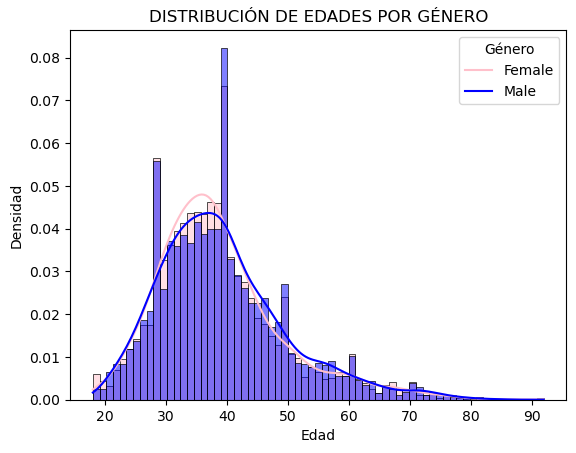

In [32]:
sns.histplot(data=df, x='Edad', hue='Genero', kde=True, stat='density', common_norm=False, palette=['blue', 'pink'])
plt.title('DISTRIBUCIÓN DE EDADES POR GÉNERO')
plt.xlabel('Edad')
plt.ylabel('Densidad')
plt.legend(title='Género', labels=['Female', 'Male'])
plt.show()

<div class="alert alert-info">
    
- En este gráfico podemos visualizar cómo se distribuyen las edades de los clientes de manera separada por género, y podemos observar si hay diferencias o similitudes en las distribuciones entre **Male** y **Female**. 
    
    Además, la densidad proporciona información sobre qué rangos de edades son más comunes o probables para cada género.
</div>

### Relación entre las edades de los clientes y el abandono con el banco


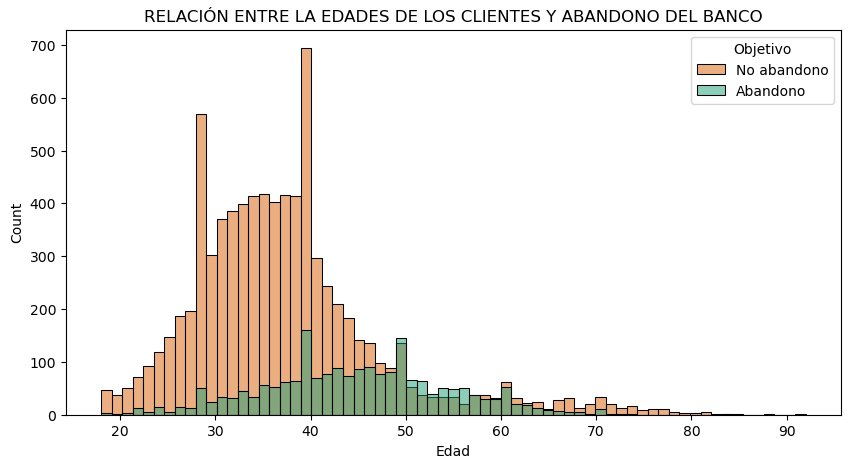

In [33]:
df_copy = df.copy()
df_copy['Objetivo'] = df_copy['Objetivo'].replace({1: 'Abandono', 0: 'No abandono'})

plt.figure(figsize=(10, 5))
sns.histplot(x=df_copy.Edad, hue=df_copy.Objetivo, palette='Dark2')
plt.title('RELACIÓN ENTRE LA EDADES DE LOS CLIENTES Y ABANDONO DEL BANCO')
plt.legend(title='Objetivo', labels=['No abandono', 'Abandono'])
plt.show()

<div class="alert alert-info">
    
* En el gráfico podemos visualizar la relación entre las edades por rangos y el abandono de clientes bancarios donde:
    
    * **1 = Abandono**.
    
    * **0 = No abandono**.
    
* Se visualiza que la proporción de **No abandono** es mayor que **Abandono**.
    
</div>

### Relación entre los rangos de edades de los clientes y el abandono con el banco

In [34]:
bins = [0, 30, 50, 70, np.inf]
labels = ['18-30', '30-50', '50-70', '70+']

df_copy = df.copy()

df_copy['Rango_Edad'] = pd.cut(df_copy['Edad'], bins=bins, labels=labels, right=False)
edad_objetivo_counts = df_copy.groupby(['Rango_Edad', 'Objetivo']).size().reset_index(name='Cantidad')

fig_6 = px.bar(edad_objetivo_counts, x='Rango_Edad', y='Cantidad', color='Objetivo',
               title='ABANDONO DE CLIENTES DEL BANCO POR RANGOS DE EDAD',
               labels={'Rango_Edad': 'Rango de Edad', 'Cantidad': 'Cantidad de Clientes', 'Objetivo': 'Abandono del Banco'},
               color_discrete_map={'0': 'blue', '1': 'red'})

fig_6.update_layout(
    xaxis_title='Rango de Edad',
    yaxis_title='Cantidad de Clientes',
    barmode='group',
)

fig_6.for_each_trace(lambda trace: trace.update(name=trace.name.replace('0', 'Se quedó').replace('1', 'Abandono')))

fig_6.show()

<div class="alert alert-info">
    
- En el gráfico podemos visualizar la relación entre las edades por rangos y el abandono de los clientes del banco donde, **0 = Se quedó** y **1 = Abandono**.
    
    * Entre **18-30 años** 1517 clientes se quedarón, mientras que 124 clientes abandonaron el banco.
    * Entre **30-50 años** 5685 clientes se quedarón, mientras que 1279 clientes abandonaron el banco.
    * Entre **50-70 años** 625 clientes se quedarón, mientras que 619 clientes abandonaron el banco.
    * Entre **70 años a más** 136 clientes se quedarón, mientras que 15 clientes abandonaron el banco.
</div>

### Relación entre el rango de salarios estimados anualmente

In [35]:
bins = [0, 50000, 100000, 150000, np.inf]
labels = ['Menor o igual a 50k', 'Más de 50k a 100k', 'Más de 100k a 150k', 'Más de 150k']

df['Rango_Salario'] = pd.cut(df['Salario_estimado'], bins=bins, labels=labels, right=False)

salario_counts = df['Rango_Salario'].value_counts()

fig= px.pie(df, names=salario_counts.index, values=salario_counts.values,
             title='RANGO DE SALARIOS ESTIMADOS DE LOS CLIENTES (ANUAL)',
             labels={'Salario_estimado': 'Cantidad de Clientes', 'Rango_Salario': 'Salario Estimado'},
             color_discrete_sequence=px.colors.qualitative.Set3)

fig.update_traces(textinfo='percent+label', pull=0.05)

fig.show()

<div class="alert alert-info">
    
- En el gráfico podemos visualizar por rangos el salario estimado y el porcentaje de clientes que perciben ese monto.
    * El **24.5%** de los clientes perciben **Menor o igual a 50k**.
    * El **25.4%** de los clientes perciben **Más de 50k a 100k**.
    * El **25.6%** de los clientes perciben **Más de 100k a 150k**.
    * El **24.6%** de los clientes perciben **Más de 150k**.

</div>

### ¿Cuál es el porcentaje en *salarios estimados* por género que perciben menor o igual a *50k*?

In [36]:
bins = [0, 50000, 100000, 150000, np.inf]
labels = ['Menor o igual a 50k', 'Más de 50k a 100k', 'Más de 100k a 150k', 'Más de 150k']

df['Rango_Salario'] = pd.cut(df['Salario_estimado'], bins=bins, labels=labels, right=False)

filtro_rango_salario = df['Rango_Salario'] == 'Menor o igual a 50k'
salario_genero_counts = df[filtro_rango_salario].groupby('Genero').size().reset_index(name='Cantidad')

fig_7 = px.pie(salario_genero_counts, names='Genero', values='Cantidad', 
               title='Distribución en género en el rango de salario "Menor o igual a 50k"',
               color='Genero', labels={'Cantidad': 'Cantidad de Clientes'},
               color_discrete_sequence=['pink', 'lightblue'])

fig_7.show()

<div class="alert alert-info">
    
- Visualizamos en el gráfico los porcentajes de salario que perciben menor o igual a 50k.
    
    * El género **Male** con un porcentaje de **54.9%** (**1346** clientes hombres) es mayor en cantidad que al género **Female**; es decir que hay más hombres que ganan un salario menor o igual a 50k.
    
    * El género **Female** con un porcentaje de **45.1%** (**1107** clientes mujeres) es menor en cantidad que ***Male**; es decir que hay menos cantidad de mujeres que perciben ese salario.

</div>

### ¿Cuál es el porcentaje en *salarios estimados* por género que perciben más de *50k* a *100k*?

In [37]:
bins = [0, 50000, 100000, 150000, np.inf]
labels = ['Menor o igual a 50k', 'Más de 50k a 100k', 'Más de 100k a 150k', 'Más de 150k']

df['Rango_Salario'] = pd.cut(df['Salario_estimado'], bins=bins, labels=labels, right=False)

filtro_rango_salario = df['Rango_Salario'] == 'Más de 50k a 100k'
salario_genero_counts = df[filtro_rango_salario].groupby('Genero').size().reset_index(name='Cantidad')

fig_8 = px.pie(salario_genero_counts, names='Genero', values='Cantidad', 
               title='Distribución en género en el rango de salario "Más de 50k a 100k"',
               color='Genero', labels={'Cantidad': 'Cantidad de Clientes'},
                color_discrete_sequence=['pink', 'lightblue'])

fig_8.show()

<div class="alert alert-info">
    
- Visualizamos en el gráfico los porcentajes de salario que perciben Más de 50k a 100k.
    
    * El género **Male** con un porcentaje de **56.2%** (**1425** clientes hombres) es mayor en cantidad que al género **Female**; es decir que hay más hombres que ganan un salario de 150k a más.
    
    * El género **Female** con un porcentaje de **43.8%** (**1112** clientes mujeres) es menor en cantidad que ***Male**; es decir que hay menos cantidad de mujeres que perciben ese salario.

</div>

### ¿Cuál es el porcentaje en *salarios estimados* por género que perciben más de *100k* a *150k*?

In [38]:
bins = [0, 50000, 100000, 150000, np.inf]
labels = ['Menor o igual a 50k', 'Más de 50k a 100k', 'Más de 100k a 150k', 'Más de 150k']

df['Rango_Salario'] = pd.cut(df['Salario_estimado'], bins=bins, labels=labels, right=False)

filtro_rango_salario = df['Rango_Salario'] == 'Más de 100k a 150k'
salario_genero_counts = df[filtro_rango_salario].groupby('Genero').size().reset_index(name='Cantidad')

fig_9 = px.pie(salario_genero_counts, names='Genero', values='Cantidad', 
                title='Distribución en género en el rango de salario "Más de 100k a 150k"',
                color='Genero', labels={'Cantidad': 'Cantidad de Clientes'},
                color_discrete_sequence=['pink', 'lightblue'])

fig_9.show()

<div class="alert alert-info">
    
- Visualizamos en el gráfico los porcentajes de salario que perciben Más de 100k a 150k.
    
    * El género **Male** con un porcentaje de **52.6%** (**1343** clientes hombres) es mayor en cantidad que al género **Female**; es decir que hay más hombres que ganan un salario de 150k a más.
    
    * El género **Female** con un porcentaje de **47.4%** (**1212** clientes mujeres) es menor en cantidad que **Male**; es decir que hay menos cantidad de mujeres que perciben ese salario.

</div>

### ¿Cuál es el porcentaje en *salarios estimados* por género que perciben más de *150k*?

In [39]:
bins = [0, 50000, 100000, 150000, np.inf]
labels = ['Menor o igual a 50k', 'Más de 50k a 100k', 'Más de 100k a 150k', 'Más de 150k']

df['Rango_Salario'] = pd.cut(df['Salario_estimado'], bins=bins, labels=labels, right=False)

filtro_rango_salario = df['Rango_Salario'] == 'Más de 150k'
salario_genero_counts = df[filtro_rango_salario].groupby('Genero').size().reset_index(name='Cantidad')

fig_10 = px.pie(salario_genero_counts, names='Genero', values='Cantidad', 
                title='Distribución en género en el rango de salario "Más de 150k"',
                color='Genero', labels={'Cantidad': 'Cantidad de Clientes'},
                color_discrete_sequence=['pink', 'lightblue'])

fig_10.show()

<div class="alert alert-info">
    
- Visualizamos en el gráfico los porcentajes de salario que perciben de 150K a más.
    
    * El género **Male** con un porcentaje de **54.7%** (**1343** clientes hombres) es mayor en cantidad que al género **Female**; es decir que hay más hombres que ganan un salario de 150k a más.
    
    * El género **Female** con un porcentaje de **45.3%** (**1112** clientes mujeres) es menor en cantidad que **Male**; es decir que hay menos cantidad de mujeres que perciben ese salario.

</div>

## 3.- Preparación de datos para árbol de decisiones

In [40]:
df.head()

,Puntaje_crediticio,Pais,Genero,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,Objetivo,Rango_Salario
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1,Más de 100k a 150k
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,Más de 100k a 150k
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,Más de 100k a 150k
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0,Más de 50k a 100k
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,Más de 50k a 100k


In [41]:
genero=df['Genero'].unique()
genero

array(['Female', 'Male'], dtype=object)

<div class="alert alert-info">
    
- Usamos **unique( )** para obtener los valores únicos de una columna **Genero** que en este caso solo son dos: **Female** y **Male**.
    
</div>

In [42]:
genero=df['Pais'].unique()
genero

array(['France', 'Spain', 'Germany'], dtype=object)

<div class="alert alert-info">
    
- Usamos **unique( )** para obtener los valores únicos de una columna **Pais** que en este caso solo son tres: **France**, **Spain** y **Germany**.
    
</div>

In [43]:
dummy_sex= pd.get_dummies(df['Genero'], prefix='sex')
dummy_country= pd.get_dummies(df['Pais'], prefix='País')

<div class="alert alert-info">
    
- Usamos variables dummy a partir de las columnas categóricas **Genero** y **Pais** en el DataFrame para convertirlas a variables binarias (0 y 1).
    
</div>

In [44]:
df= pd.concat([df,dummy_sex],axis=1)
df= pd.concat([df,dummy_country],axis=1)
df

,Puntaje_crediticio,Pais,Genero,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,Objetivo,Rango_Salario,sex_Female,sex_Male,País_France,País_Germany,País_Spain
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1,Más de 100k a 150k,1,0,1,0,0
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,Más de 100k a 150k,1,0,0,0,1
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,Más de 100k a 150k,1,0,1,0,0
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0,Más de 50k a 100k,1,0,1,0,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,Más de 50k a 100k,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0.00,2,1,0,96270.64,0,Más de 50k a 100k,0,1,1,0,0
9996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0,Más de 100k a 150k,0,1,1,0,0
9997,709,France,Female,36,7,0.00,1,0,1,42085.58,1,Menor o igual a 50k,1,0,1,0,0
9998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1,Más de 50k a 100k,0,1,0,1,0


<div class="alert alert-info">
    
- Realizamos una concatenación horizontal de los DataFrames. Es decir, las columnas de los DataFrames se combinarán en función de su posición, y los datos de las columnas con variables dummy se añaden al DataFrame original como nuevas columnas.
    
</div>

In [45]:
df_dummies=df.drop(['Genero','Pais','Puntaje_crediticio', 'Rango_Salario'],axis=1)
df_dummies.head()

,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,Objetivo,sex_Female,sex_Male,País_France,País_Germany,País_Spain
0,42,2,0.00,1,1,1,101348.88,1,1,0,1,0,0
1,41,1,83807.86,1,0,1,112542.58,0,1,0,0,0,1
2,42,8,159660.80,3,1,0,113931.57,1,1,0,1,0,0
3,39,1,0.00,2,0,0,93826.63,0,1,0,1,0,0
4,43,2,125510.82,1,1,1,79084.10,0,1,0,0,0,1


<div class="alert alert-info">
    
- Aplicamos **drop( )** para eliminar las columnas especificadas **Genero**, **Pais**, **Puntaje_crediticio** y **Rango_Salario**, debido a que ya existen columnas como **sex_Female**, **sex_Male** y **País_France**, **País_Germany**, **País_Spain**. Las columnas **Puntaje_crediticio** y **Rango_Salario** son innecesarias.

</div>

In [46]:
status(df_dummies)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,Edad,0,0.0,0,0.0000,70,int64
1,Tenencia_en_años,0,0.0,413,0.0413,11,int64
2,Saldo_en_cuenta,0,0.0,3617,0.3617,6382,float64
3,Numero_productos,0,0.0,0,0.0000,4,object
4,Tarjeta_credito,0,0.0,0,0.0000,2,object
5,Miembro_activo,0,0.0,0,0.0000,2,object
6,Salario_estimado,0,0.0,0,0.0000,9999,float64
7,Objetivo,0,0.0,0,0.0000,2,object
8,sex_Female,0,0.0,5457,0.5457,2,uint8
9,sex_Male,0,0.0,4543,0.4543,2,uint8


<div class="alert alert-info">
    
- Usamos la función **status(df_dummies)** que nos proporcionará información valiosa sobre las variables numéricas y categóricas del DataFrame además podemos ver la cantidad de valores únicos de las columnas, vemos que no hay presencia de valores NaN. 
    
    Las variables del DataFrame estan representadas de manera adecuada, estas han sido convertidas en variables dummy para que el algoritmo de árbol de decisiones pueda entender.
    
    Existe una variable objetivo en el DataFrame que el árbol de decisiones intentará predecir.

</div>

In [47]:
df_dummies.to_csv('Data/bancos_limpio_respaldo2.csv')

<div class="alert alert-info">
    
- Guardamos el DataFrame **df_dummies** en un archivo CSV llamado **bancos_limpio_respaldo2.csv**, esto sera útil porque de esta manera hacemos una copia de seguridad con los datos limpios, para poder ser utilizado en el árbol de decisiones de machine learning.
</div>

## 4.- Modelo árbol de decisiones

### 4.1. Separamos las variables caracteristicas de la variable objetivo

In [48]:
arbol=pd.read_csv('Data/bancos_limpio_respaldo2.csv',index_col=0)
arbol

,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,Objetivo,sex_Female,sex_Male,País_France,País_Germany,País_Spain
0,42,2,0.00,1,1,1,101348.88,1,1,0,1,0,0
1,41,1,83807.86,1,0,1,112542.58,0,1,0,0,0,1
2,42,8,159660.80,3,1,0,113931.57,1,1,0,1,0,0
3,39,1,0.00,2,0,0,93826.63,0,1,0,1,0,0
4,43,2,125510.82,1,1,1,79084.10,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,39,5,0.00,2,1,0,96270.64,0,0,1,1,0,0
9996,35,10,57369.61,1,1,1,101699.77,0,0,1,1,0,0
9997,36,7,0.00,1,0,1,42085.58,1,1,0,1,0,0
9998,42,3,75075.31,2,1,0,92888.52,1,0,1,0,1,0


<div class="alert alert-info">
    
- Cargamos el archivo CSV **bancos_limpio_respaldo2.csv** en un DataFrame bajo la variable de nombre **arbol** para  utilizarlo en el árbol de decisiones de machine learning.
    
</div>

In [49]:
X = arbol.drop(columns='Objetivo')
X

,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,sex_Female,sex_Male,País_France,País_Germany,País_Spain
0,42,2,0.00,1,1,1,101348.88,1,0,1,0,0
1,41,1,83807.86,1,0,1,112542.58,1,0,0,0,1
2,42,8,159660.80,3,1,0,113931.57,1,0,1,0,0
3,39,1,0.00,2,0,0,93826.63,1,0,1,0,0
4,43,2,125510.82,1,1,1,79084.10,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,39,5,0.00,2,1,0,96270.64,0,1,1,0,0
9996,35,10,57369.61,1,1,1,101699.77,0,1,1,0,0
9997,36,7,0.00,1,0,1,42085.58,1,0,1,0,0
9998,42,3,75075.31,2,1,0,92888.52,0,1,0,1,0


<div class="alert alert-info">
    
- El eje **X** contiene todas las columnas del DataFrame **arbol** excepto la columna **Objetivo**. Cada fila de X corresponde a un conjunto de datos, y cada columna representa una característica o variable que se utilizará como entrada para el modelo.
    
</div> 

In [50]:
Y = arbol.Objetivo
Y

0       1
1       0
2       1
3       0
4       0
       ..
9995    0
9996    0
9997    1
9998    1
9999    0
Name: Objetivo, Length: 10000, dtype: int64

<div class="alert alert-info">
    
 **Y** se obtiene seleccionando la columna **Objetivo** del DataFrame **arbol**, lo que representa los valores que se quieren predecir.
    
   * El valor **1** representa que **Abandono el banco** de la columna **Objetivo**.
    
   * El valor **0** representa que **Se quedó en el banco** de la columna **Objetivo**.
    
   * Existen 1000 valores entre **1 (unos)** y **0 (ceros)** en la columna **Objetivo**.
    
</div> 

### 4.2. Entrenamos el algoritmo

Dividimos los datos, en **Entrenamiento** (75%) y de **Prueba** (25%).

In [51]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.75, random_state=0)

<div class="alert alert-info">
    
* Dividimos los datos en conjuntos de entrenamiento y prueba, para el entrenamiento y evaluación del modelo de machine learning.
    
* Usamos la función **train_test_split( )** la utilizamos para dividir los datos en conjuntos de entrenamiento y prueba.
    
* Asignamos el **75%** de los datos al conjunto de entrenamiento (X_train y Y_train) y el **25%** restante al conjunto de prueba.
    
* Usamos **random_state=0** para fijar una semilla para el generador de números aleatorios. Esto garantiza que cada vez que se ejecute el código, se obtendrán las mismas particiones de entrenamiento y prueba.
    
</div> 

In [52]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7500 entries, 2967 to 2732
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Edad              7500 non-null   int64  
 1   Tenencia_en_años  7500 non-null   int64  
 2   Saldo_en_cuenta   7500 non-null   float64
 3   Numero_productos  7500 non-null   int64  
 4   Tarjeta_credito   7500 non-null   int64  
 5   Miembro_activo    7500 non-null   int64  
 6   Salario_estimado  7500 non-null   float64
 7   sex_Female        7500 non-null   int64  
 8   sex_Male          7500 non-null   int64  
 9   País_France       7500 non-null   int64  
 10  País_Germany      7500 non-null   int64  
 11  País_Spain        7500 non-null   int64  
dtypes: float64(2), int64(10)
memory usage: 761.7 KB


<div class="alert alert-info">
    
* Utilizamos **X_train.info( )** para obtener información sobre el conjunto de entrenamiento **X_train**. 
    
* Se muestra un resumen conciso de la estructura del DataFrame **X_train**, incluyendo el tipo de datos de cada columna. 

* La cantidad de valores no nulos en cada columna de entrenamiento **X_train** son de **7500** valores.
    
</div> 

In [53]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2500 entries, 9394 to 3332
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Edad              2500 non-null   int64  
 1   Tenencia_en_años  2500 non-null   int64  
 2   Saldo_en_cuenta   2500 non-null   float64
 3   Numero_productos  2500 non-null   int64  
 4   Tarjeta_credito   2500 non-null   int64  
 5   Miembro_activo    2500 non-null   int64  
 6   Salario_estimado  2500 non-null   float64
 7   sex_Female        2500 non-null   int64  
 8   sex_Male          2500 non-null   int64  
 9   País_France       2500 non-null   int64  
 10  País_Germany      2500 non-null   int64  
 11  País_Spain        2500 non-null   int64  
dtypes: float64(2), int64(10)
memory usage: 253.9 KB


<div class="alert alert-info">
    
* Utilizamos **X_test.info()** para obtener información sobre el conjunto de prueba **X_test**. 
    
* Se muestra un resumen conciso de la estructura del DataFrame **X_test**, incluyendo el tipo de datos de cada columna. 

* La cantidad de valores no nulos en cada columna **X_test** son de **2500** valores.
    
</div> 

**Creamos el algoritmo con los mejores parametros**

In [54]:
arbol=DecisionTreeClassifier(max_depth=5, criterion='gini', min_samples_split=5, min_samples_leaf=2, 
                             min_impurity_decrease=0.0)

<div class="alert alert-info">

**Parámetros que se han establecido**

* **max_depth=5 :** Establece la profundidad maxima del árbol.
* **criterion='gini' :** El criterio utilizado sirve para medir la calidad de una partición en un nodo. Lo que a su influiye en el número de falsos positivos y falsos negativos.
* **min_samples_split=5 :** Establece el minimo de muestras necesarias para dividir un nodo (sus valores evitan divisiones excesivas y el sobre ajuste).
* **min_samples_leaf=2 :** Establece el minimo de muestras para estar en una hoja (sus valores evitan el sobre ajuste).
* **min_impurity_decrease=0.0 :** Un nodo se dividirá si la división produce una disminución de la impureza mayor o igual que este valor.
    
</div> 

**Entrenamos el modelo**

In [55]:
arbol_Objetivo=arbol.fit(X_train, Y_train)
arbol_Objetivo

DecisionTreeClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=5)

<div class="alert alert-info">
    
* Entrenamos el modelo de árbol de decisión utilizando los conjuntos de entrenamiento **X_train** y **Y_train**.
    
* Llamamos a **fit( )** para que el algoritmo de aprendizaje ajuste los parámetros del árbol utilizando los datos de entrenamiento para hacer las predicciones. 
    
* Una vez que se ha entrenado el modelo utilizando arbol.fit(X_train, Y_train), la variable **arbol_Objetivo** contiene el modelo entrenado, es decir, el árbol de decisión con sus parámetros ajustados según los datos de entrenamiento.
    
</div> 

In [56]:
precision=arbol_Objetivo.score(X_test,Y_test)
print('Precisión del modelo Datos Prueba :')
print(precision)

Precisión del modelo Datos Prueba :
0.8604


<div class="alert alert-info">
    
* Utilizamos **score(X_test, Y_test)** para hacer predicciones en el conjunto de prueba **X_test**, y luego la compara con las etiquetas reales **Y_test**.
    
* La precisión del modelo esta por encima del **0.8000**, una mayor precisión indica que el modelo ha aprendido a hacer predicciones más precisas y acertadas en datos no vistos, lo que es un indicativo de un buen desempeño del modelo.
    
</div> 

In [57]:
precision2=arbol_Objetivo.score(X_train,Y_train)
print('Precisión del modelo Datos Prueba :')
print(precision2)

Precisión del modelo Datos Prueba :
0.858


<div class="alert alert-info">
    
* Utilizamos **score(X_train,Y_train)** para hacer predicciones en el conjunto de entrenamiento **X_train**, y luego la compara con las etiquetas reales **Y_train**.
    
* La precisión del modelo esta por encima del **0.8000**, una mayor precisión indica que el modelo ha aprendido a hacer predicciones más precisas y acertadas, lo que es un indicativo de un buen desempeño del modelo.
    
</div> 

In [58]:
X.columns.values

array(['Edad', 'Tenencia_en_años', 'Saldo_en_cuenta', 'Numero_productos',
       'Tarjeta_credito', 'Miembro_activo', 'Salario_estimado',
       'sex_Female', 'sex_Male', 'País_France', 'País_Germany',
       'País_Spain'], dtype=object)

<div class="alert alert-info">
    
* Visualizamos los nombres de las columnas del DataFrame en un array.
    
</div> 

In [59]:
Y.values

array([1, 0, 1, ..., 1, 1, 0])

<div class="alert alert-info">
    
* Visualizamos los valores de la columna **Y** del DataFrame en un array.
    
</div> 

In [60]:
y_string = [str(x) for x in Y.values]

<div class="alert alert-info">
    
* Convertimos los valores del vector **Y** (valores Objetivo) en formato de cadena (string).
    
</div> 

In [61]:
fig = plt.figure(figsize=(80,20), dpi=300)

tree.plot_tree(arbol_Objetivo, feature_names=list(X.columns.values), class_names=list(y_string), filled=True, fontsize=15)
plt.show()

<div class="alert alert-info">
    
* Visualizamos el árbol de decisión generado por el modelo de clasificación **arbol_Objetivo** , el árbol nos permite entender cómo el modelo toma decisiones basadas en las características de los datos y cómo clasifica las observaciones en diferentes clases.
    
</div> 

In [62]:
fig.savefig('Data/arbol_decision2.png')

<div class="alert alert-info">
    
* Guardamos la figura del árbol de decisión con la función **savefig( )**.
    
</div> 

In [63]:
a=X_train.sample()
a

,Edad,Tenencia_en_años,Saldo_en_cuenta,Numero_productos,Tarjeta_credito,Miembro_activo,Salario_estimado,sex_Female,sex_Male,País_France,País_Germany,País_Spain
5919,49,8,0.0,2,1,0,162012.6,0,1,0,0,1


<div class="alert alert-info">
    
* **X_train.sample( )** selecciona una muestra aleatoria de observaciones del conjunto de entrenamiento **X_train**.
    
</div> 

In [64]:
arbol.predict_proba(a)

array([[0.81147541, 0.18852459]])

<div class="alert alert-info">
    
* En el array visualizamos las probabilidades de predicción del modelo de árbol de decisión,  es útil para ver las probabilidades de pertenencia a cada clase.
    
</div> 

In [65]:
Y_pred=arbol_Objetivo.predict(X_test)
Y_pred

array([0, 0, 0, ..., 0, 0, 0])

<div class="alert alert-info">
    
* La variable **Y_pred** contiene las predicciones realizadas por el modelo de árbol de decisión sobre el conjunto de prueba X_test, lo que permite evaluar el rendimiento del modelo y comparar las predicciones con las etiquetas reales.
    
</div> 

In [66]:
Y_pred.size

2500

<div class="alert alert-info">
    
* Visualizamos el tamaño (número de elementos) del array, indica las predicciones que se han realizado que son **2500** en total. 
    
</div> 

## 4.3. Verificación de la precisión (ocurrancy) y del modelo.

**Creamos la matriz de confusión**

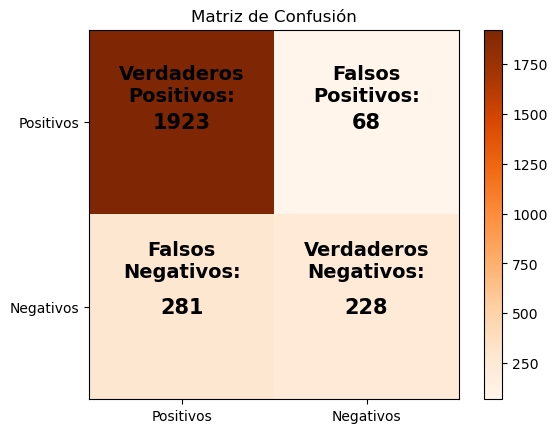

In [67]:
Matriz_de_confusion = confusion_matrix(Y_test, Y_pred)

unique_labels = ['Positivos', 'Negativos']

plt.imshow(Matriz_de_confusion, cmap='Oranges', interpolation='nearest')

plt.colorbar()
tick_marks = np.arange(len(unique_labels))
plt.xticks(tick_marks, unique_labels)
plt.yticks(tick_marks, unique_labels)

for i in range(len(unique_labels)):
    for j in range(len(unique_labels)):
        value = Matriz_de_confusion[i, j]
        plt.text(j, i, str(value), ha='center', va='center', color='black', fontsize=15, fontweight='bold')

plt.text(0.00, -0.20, 'Verdaderos\nPositivos:', ha='center', va='center', color='black', fontsize=14, fontweight='bold')
plt.text(1.00, -0.20, 'Falsos\nPositivos:', ha='center', va='center', color='black', fontsize=14, fontweight='bold')
plt.text(0.00, 0.75, 'Falsos\nNegativos:', ha='center', va='center', color='black', fontsize=14, fontweight='bold')
plt.text(1.00, 0.75, 'Verdaderos\nNegativos:', ha='center', va='center', color='black', fontsize=14, fontweight='bold')

plt.title('Matriz de Confusión')

plt.show()

<div class="alert alert-info">
    
* Esta matriz nos permite tener una visión completa de cómo está funcionando el modelo en términos de clasificación. En la matriz se comparan las predicciones del modelo con las verdaderas etiquetas de los datos para cada clase.
    
</div> 

**Verificamos la precisión global del modelo**

In [68]:
Precision_Global=np.sum(Matriz_de_confusion.diagonal())/np.sum(Matriz_de_confusion)
Precision_Global

0.8604

<div class="alert alert-info">
    
* Visualizamos la precisión global del modelo, esta es una métrica que nos indica la proporción de instancias que fueron clasificadas correctamente en relación con el total de instancias, que es el número total de ejemplos que se utilizaron para evaluar el modelo después de haber sido entrenado.
    
</div> 

**Calculamos la precisión para cada clase del modelo**

In [69]:
Precision_Si=(Matriz_de_confusion[0,0])/sum(Matriz_de_confusion[0,])
Precision_Si

0.9658463083877449

<div class="alert alert-info">
    
* Calculamos la precisión para la clase positiva (clase "1" o "verdaderos positivos"). En una matriz de confusión, el elemento en la posición [0,0] representa los verdaderos positivos.

</div> 

In [70]:
Precision_No=(Matriz_de_confusion[1,1])/sum(Matriz_de_confusion[1,])
Precision_No

0.44793713163064836

<div class="alert alert-info">
    
* Calculamos la precisión para la clase negativa (la clase "0" o la clase "verdaderos negativos"). Esta métrica es útil para evaluar el rendimiento del modelo en la detección de la clase negativa.

</div> 

### IMPORTANCIA DE LA COLUMNAS CARACTERISTICAS

In [71]:
caract = X.shape[1]
importances = arbol_Objetivo.feature_importances_
indices_ordenados = np.argsort(importances)[::-1] 

data = {
    'Características': ['Edad', 'Tenencia_en_años', 'Saldo_en_cuenta', 'Numero_productos',
                        'Tarjeta_credito', 'Miembro_activo', 'Salario_estimado',
                        'sex_Female', 'sex_Male', 'País_France', 'País_Germany',
                        'País_Spain'],
    'Importancia': importances[indices_ordenados]
}
df_importancia = pd.DataFrame(data)

fig = px.bar(df_importancia, x='Importancia', y='Características', orientation='h',
             color='Importancia', color_continuous_scale='Plasma', text='Importancia')

fig.update_layout(title='Importancia de las características en el modelo de árbol de decisiones',
                  title_x=0.5,  
                  xaxis_title='Importancia de las columnas características',
                  yaxis_title='Características',
                  xaxis=dict(tickformat='.2%'),
                  yaxis=dict(categoryorder='total ascending'))

fig.show()

<div class="alert alert-info">
    
* Visualizamos mediante una gráfica la importancia de las columnas características en el modelo de árbol de decisiones. Es útil para entender qué columnas características tienen mayor influencia en las predicciones del modelo.
    
* Para el modelo de árbol de decisiones la columna caracteristica **Edad** esa la más importante. Es la característica más relevante, es el factor más determinante para clasificar o predecir el objetivo (la variable **Objetivo**) en el conjunto de datos.

</div> 

In [ ]:
from dash import dash, dcc, html
import dash_bootstrap_components as dbc

app = dash.Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

app.layout = html.Div([
    dbc.Row([
        dbc.Col(dcc.Graph(id='another_graph1', figure=fig_1), width=6),
        dbc.Col(dcc.Graph(id='another_graph2', figure=fig_2), width=6),
    ]),
    dbc.Row([
        dbc.Col(dcc.Graph(id='another_graph3', figure=fig_3), width=6),
        dbc.Col(dcc.Graph(id='another_graph4', figure=fig_4), width=6),
    ]),
    dbc.Row([
        dbc.Col(dcc.Graph(id='another_graph5', figure=fig_5), width=6),
        dbc.Col(dcc.Graph(id='another_graph6', figure=fig_6), width=6),
    ]),
    dbc.Row([
        dbc.Col(dcc.Graph(id='another_graph7', figure=fig_7), width=6),
        dbc.Col(dcc.Graph(id='another_graph8', figure=fig_8), width=6),
    ]),
    dbc.Row([
        dbc.Col(dcc.Graph(id='another_graph9', figure=fig_9), width=6),
        dbc.Col(dcc.Graph(id='another_graph10', figure=fig_10), width=6),
    ]),
])

if __name__ == "__main__":
    app.run_server(debug=True, use_reloader=False, port=8266)

Dash is running on http://127.0.0.1:8266/

 * Serving Flask app '__main__'
 * Debug mode: on


![linea 1](https://user-images.githubusercontent.com/19308295/115926252-2b8a0c00-a448-11eb-9d9c-b43beaf0ff68.png)

<center> <h1>  BIBLIOGRAFÍA </h1> </center> 

![linea 1](https://user-images.githubusercontent.com/19308295/115926252-2b8a0c00-a448-11eb-9d9c-b43beaf0ff68.png)

[1] https://cienciadedatos.net/documentos/pystats05-correlacion-lineal-python

[2] https://gallantlab.org/pycortex/colormaps.html

[3] https://plotly.com/python/

[4] https://plotly.com/python/bar-charts/